## О чем речь

- думаю что данные with crash искуственно изменены,не годны для расчета корреляций
- Здесь рассматривались данные с файлов without crash, объединяются два файла 00086Е и общие данные с 0008В9 для установки PV18
- временной ряд разбил по минутам, брал средние значения датчиков в минуту
- результат = таблица, где каждый датчик с какими датчиками максимально коррелиррует в прямую и обратную сторону

In [12]:
import pandas as pd
import numpy as np
import seaborn as sns

### Функции 

In [13]:
def minutes(data): # группировка по минутам
    minutes = []
    for i in range(len(data)):
        minute = data.time[i][:-3]
        minutes.append(minute)
    data['minutes'] = minutes
    data = data.groupby(['minutes'], as_index=False).mean()
    return data

In [14]:
def corr(df,method): # корреляции
    p = df.corr(method = method)
    p[p == 1] = 0
    return p

In [15]:
def find_max(data): # макс. корреляция двух датчиков
    values = []
    i = 0
    for each in data.columns:
        array = np.array(data[each])
        max_el = np.amax(array)
        result = np.where(array == max_el)
        values.append([data.columns[i],data.columns[result[0][0]],max_el])  
        i += 1
    return values

def find_min(data): # мкс. отрицат. значение кореляции 2 датчиков
    values = []
    i = 0
    for each in data.columns:
        array = np.array(data[each])
        min_el = np.amin(array)
        result = np.where(array == min_el)
        values.append([data.columns[i],data.columns[result[0][0]],min_el])  
        i += 1
    return values

In [16]:
def corr_table(data): # таблица максимальных корр.
    corr = pd.DataFrame(find_max(data),columns=['Sensor','Sensor max','Value max'])
    min_corr = pd.DataFrame(find_min(data),columns=['Sensor','Sensor min','Value min'])
    corr['Sensor min'] = min_corr['Sensor min']
    corr['Value min'] = min_corr['Value min']
    return corr

In [17]:
def plotting(data,variables): # построение графиков
    sns.set()
    sns_plot = sns.pairplot(data[data.columns] ,vars = variables)
    sns_plot.savefig("output17.png")
    return sns_plot

# Without crash

# Установка ПВ-18 

##  Модуль № 00086Е

1. Температура наружного воздуха (ТЕ 1 )
2. Температура вытяжного воздуха (ТЕ 2 )
3. Температура приточного воздуха (ТЕ 3 )
4. Температура до рекуператора (ТЕ 4 )
5. Температура после рекуператора (ТЕ 5 )
6. Температура обратного теплоносителя (ТЕ 6 )
7. Освещённость в вент.камере 
8. Давление в обратном трубопроводе
9. Давление в прямом трубопроводе 

In [18]:
cols = ['time','id','Тем_нар','Тем_вытяж','Тем_прит','Тем_до_рек','Тем_пос_рек','Тем_обр_тепл','O','Дав_обр_труб','Дав_прям_труб']
data18 = pd.read_csv('data-0008B0-PV18.csv', names = cols, header = 0) 

In [19]:
data18.tail(20)

,time,id,Тем_нар,Тем_вытяж,Тем_прит,Тем_до_рек,Тем_пос_рек,Тем_обр_тепл,O,Дав_обр_труб,Дав_прям_труб
99980,2019-01-17 14:33:58,0008B0,483,710,702,572,597,755,0,1774,1916
99981,2019-01-17 14:33:28,0008B0,483,710,705,569,597,755,0,1771,1916
99982,2019-01-17 14:32:27,0008B0,480,713,705,572,599,755,0,1774,1913
99983,2019-01-17 14:29:44,0008B0,477,710,702,572,597,752,0,1774,1921
99984,2019-01-17 14:27:35,0008B0,483,710,702,572,597,749,0,1777,1921
99985,2019-01-17 14:26:57,0008B0,480,708,702,569,597,749,0,1777,1921
99986,2019-01-17 14:26:12,0008B0,480,716,705,572,599,752,0,1777,1921
99987,2019-01-17 14:25:27,0008B0,480,713,705,569,597,752,0,1777,1927
99988,2019-01-17 14:24:49,0008B0,480,710,705,572,597,752,0,1782,1930
99989,2019-01-17 14:24:42,0008B0,480,708,705,572,594,752,0,1780,1927


### Группировка данных по минутам

In [20]:
df1 = minutes(data18)
df1.to_csv('PV18_in_minutes.csv')
df1.head(10)

,minutes,Тем_нар,Тем_вытяж,Тем_прит,Тем_до_рек,Тем_пос_рек,Тем_обр_тепл,O,Дав_обр_труб,Дав_прям_труб
0,2019-01-17 13:58,477.0,710.000000,708.0,572.0,599.0,763.0,0.0,1782.000000,1943.0
1,2019-01-17 14:06,480.0,710.000000,705.0,569.0,599.0,749.0,0.0,1785.000000,1946.0
2,2019-01-17 14:09,480.0,710.000000,702.0,572.0,597.0,752.0,0.0,1788.000000,1949.0
3,2019-01-17 14:11,480.0,710.000000,702.0,572.0,599.0,755.0,0.0,1785.000000,1946.0
4,2019-01-17 14:14,483.0,710.000000,708.0,572.0,599.0,758.0,0.0,1785.000000,1946.0
5,2019-01-17 14:16,480.0,713.000000,708.0,572.0,599.0,763.0,0.0,1782.000000,1938.0
6,2019-01-17 14:17,477.0,710.000000,708.0,572.0,597.0,763.0,0.0,1782.000000,1935.0
7,2019-01-17 14:18,477.0,710.000000,707.5,570.5,597.0,763.0,0.0,1782.000000,1935.0
8,2019-01-17 14:24,479.0,709.333333,705.0,572.0,596.0,753.0,0.0,1780.666667,1928.0
9,2019-01-17 14:25,480.0,713.000000,705.0,569.0,597.0,752.0,0.0,1777.000000,1927.0


## Модуль № 0008В9

1. Ввод питания фаза А  (100А)
2. Ввод питания фаза В  (100А)
3. Ввод питания фаза С (100А)
4. ПВ-17 фаза  А (50А) не нужно
5. ПВ-17 фаза  В (50А) не нужно
6. ПВ-17 фаза  С (50А) не нужно
7. ПВ-18 фаза  А (50А) 
8. ПВ-18 фаза  В (50А) 
9. ПВ-18 фаза  С (50А)


In [21]:
cols1 = ['time','id','Общ_ВводА','Общ_ВводB','Общ_ВводC','Ввод_17_А','Ввод_17_B','Ввод_17_C','Ввод_18_А','Ввод_18_B','Ввод_18_C']
data1718 = pd.read_csv('data-0008B9.csv', names = cols1, header = 0) 
data1718.drop(['Ввод_17_А','Ввод_17_B','Ввод_17_C','id'], axis = 1,inplace = True)
data1718.sample(10)

,time,Общ_ВводА,Общ_ВводB,Общ_ВводC,Ввод_18_А,Ввод_18_B,Ввод_18_C
68593,2019-02-14 19:44:22,24168,24016,23924,50,629,644
94959,2019-02-09 04:40:21,24046,23893,23832,50,629,644
53913,2019-02-17 23:00:53,24260,24168,24077,50,629,660
24885,2019-02-24 04:05:55,24077,23955,23893,50,629,644
71239,2019-02-14 06:09:55,23893,23741,23680,50,1412,1504
78263,2019-02-12 18:10:56,24077,23893,23863,50,629,644
86971,2019-02-10 21:33:19,24351,24138,24046,50,629,660
24066,2019-02-24 08:18:14,23955,23802,23710,50,1443,1520
74970,2019-02-13 11:03:33,24138,24046,23893,50,2211,2241
3859,2019-02-28 15:57:05,23893,23741,23680,50,1443,1458


In [22]:
df2 = minutes(data1718)
df2.to_csv('PV1718_in_minutes.csv')
df2.sample(10)

,minutes,Общ_ВводА,Общ_ВводB,Общ_ВводC,Ввод_18_А,Ввод_18_B,Ввод_18_C
29432,2019-02-28 13:46,23944.666667,23822.000000,23741.000000,50.0,2216.000000,2195.333333
4994,2019-02-11 14:11,24178.333333,24015.666667,23924.000000,50.0,2241.000000,2226.000000
28400,2019-02-27 20:34,24229.000000,24076.666667,23995.333333,50.0,629.000000,644.000000
4030,2019-02-10 21:59,24168.000000,24016.000000,23944.666667,50.0,629.000000,644.000000
6850,2019-02-12 21:07,24178.333333,24036.000000,23975.000000,50.0,629.000000,660.000000
26217,2019-02-26 08:11,23842.333333,23720.333333,23608.666667,50.0,2241.333333,2170.000000
12988,2019-02-17 03:27,24209.000000,24036.000000,23955.000000,50.0,629.000000,644.000000
11365,2019-02-16 00:22,24178.333333,24026.000000,23944.666667,50.0,629.000000,644.000000
12357,2019-02-16 16:56,23944.666667,23801.666667,23761.000000,50.0,629.000000,644.000000
5020,2019-02-11 14:37,24097.000000,23965.000000,23872.666667,50.0,2256.666667,2262.000000


## Joining

In [23]:
df1 = pd.read_csv('PV18_in_minutes.csv',index_col='Unnamed: 0') 
df2 = pd.read_csv('PV1718_in_minutes.csv',index_col='Unnamed: 0') 
df = pd.merge(df1,df2)
df.sample(10)

,minutes,Тем_нар,Тем_вытяж,Тем_прит,Тем_до_рек,Тем_пос_рек,Тем_обр_тепл,O,Дав_обр_труб,Дав_прям_труб,Общ_ВводА,Общ_ВводB,Общ_ВводC,Ввод_18_А,Ввод_18_B,Ввод_18_C
7815,2019-02-20 06:40,520.142857,710.428571,645.571429,588.000,608.285714,635.000000,0.0,1778.714286,1928.714286,23862.750000,23687.500000,23656.750000,50.00,2191.25,2264.50
7592,2019-02-20 02:57,524.000000,594.500000,724.000000,569.000,522.500000,758.000000,0.0,1736.750000,1867.750000,24138.000000,23985.000000,23903.333333,50.00,629.00,644.00
10205,2019-02-22 14:26,449.000000,713.000000,716.000000,535.000,563.000000,788.000000,0.0,1791.000000,1960.000000,23977.750000,23847.500000,23756.000000,50.00,2256.75,2280.00
7785,2019-02-20 06:10,544.000000,618.500000,721.625000,583.000,538.000000,769.000000,0.0,1769.375000,1901.250000,23695.000000,23573.000000,23527.000000,50.00,1381.50,1527.00
15583,2019-02-28 23:17,535.000000,580.625000,727.000000,578.500,538.750000,758.000000,0.0,1763.000000,1892.375000,24249.666667,24066.666667,24016.000000,50.00,629.00,644.00
9388,2019-02-21 12:42,477.000000,721.500000,703.500000,560.000,585.000000,759.500000,0.0,1681.750000,1817.750000,23863.000000,23702.500000,23588.000000,49.75,2256.75,2206.75
7706,2019-02-20 04:51,532.250000,604.500000,723.000000,574.000,533.000000,755.000000,0.0,1749.000000,1879.750000,23781.333333,23629.000000,23619.000000,50.00,614.00,644.00
14463,2019-02-28 04:37,524.375000,574.750000,719.750000,571.625,524.750000,754.250000,0.0,1819.500000,1993.000000,23863.000000,23680.000000,23608.666667,50.00,614.00,644.00
1063,2019-02-12 06:16,516.857143,666.428571,778.000000,563.000,554.142857,924.857143,0.0,1424.714286,1649.571429,23893.333333,23741.000000,23649.333333,50.00,2175.00,2236.00
3754,2019-02-16 22:02,547.000000,613.000000,727.000000,588.000,544.000000,758.000000,0.0,1596.000000,1752.000000,24107.000000,23939.500000,23863.000000,50.00,629.00,644.00


In [24]:
df18 = df.drop(['minutes','O'],axis = 1)

In [25]:
print('Первый датасет =',len(data18),'; После groupby = ', len(df1))
print('Второй датасет =',len(data1718),'; После groupby = ', len(df2))
print('После join =', len(df))

Первый датасет = 100000 ; После groupby =  21300
Второй датасет = 100000 ; После groupby =  30749
После join = 16075


In [26]:
pearson18 = corr(df18,'pearson')
pearson18[pearson18>0.95]

,Тем_нар,Тем_вытяж,Тем_прит,Тем_до_рек,Тем_пос_рек,Тем_обр_тепл,Дав_обр_труб,Дав_прям_труб,Общ_ВводА,Общ_ВводB,Общ_ВводC,Ввод_18_А,Ввод_18_B,Ввод_18_C
Тем_нар,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Тем_вытяж,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Тем_прит,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Тем_до_рек,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Тем_пос_рек,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Тем_обр_тепл,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Дав_обр_труб,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.987874,NaN,NaN,NaN,NaN,NaN,NaN
Дав_прям_труб,NaN,NaN,NaN,NaN,NaN,NaN,0.987874,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Общ_ВводА,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.990899,0.988396,NaN,NaN,NaN
Общ_ВводB,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.990899,NaN,0.989134,NaN,NaN,NaN


In [27]:
cor_table18 = corr_table(pearson18)
cor_table18.drop(['Sensor min','Value min'],axis = 1,inplace=True)
cor_table18.columns = ['Sensor A','Sensor B','Max corrolation']
cor_table18[cor_table18['Max corrolation']>0.9]

,Sensor A,Sensor B,Max corrolation
1,Тем_вытяж,Тем_пос_рек,0.939371
4,Тем_пос_рек,Тем_вытяж,0.939371
6,Дав_обр_труб,Дав_прям_труб,0.987874
7,Дав_прям_труб,Дав_обр_труб,0.987874
8,Общ_ВводА,Общ_ВводB,0.990899
9,Общ_ВводB,Общ_ВводА,0.990899
10,Общ_ВводC,Общ_ВводB,0.989134
12,Ввод_18_B,Ввод_18_C,0.998168
13,Ввод_18_C,Ввод_18_B,0.998168


## Full plot

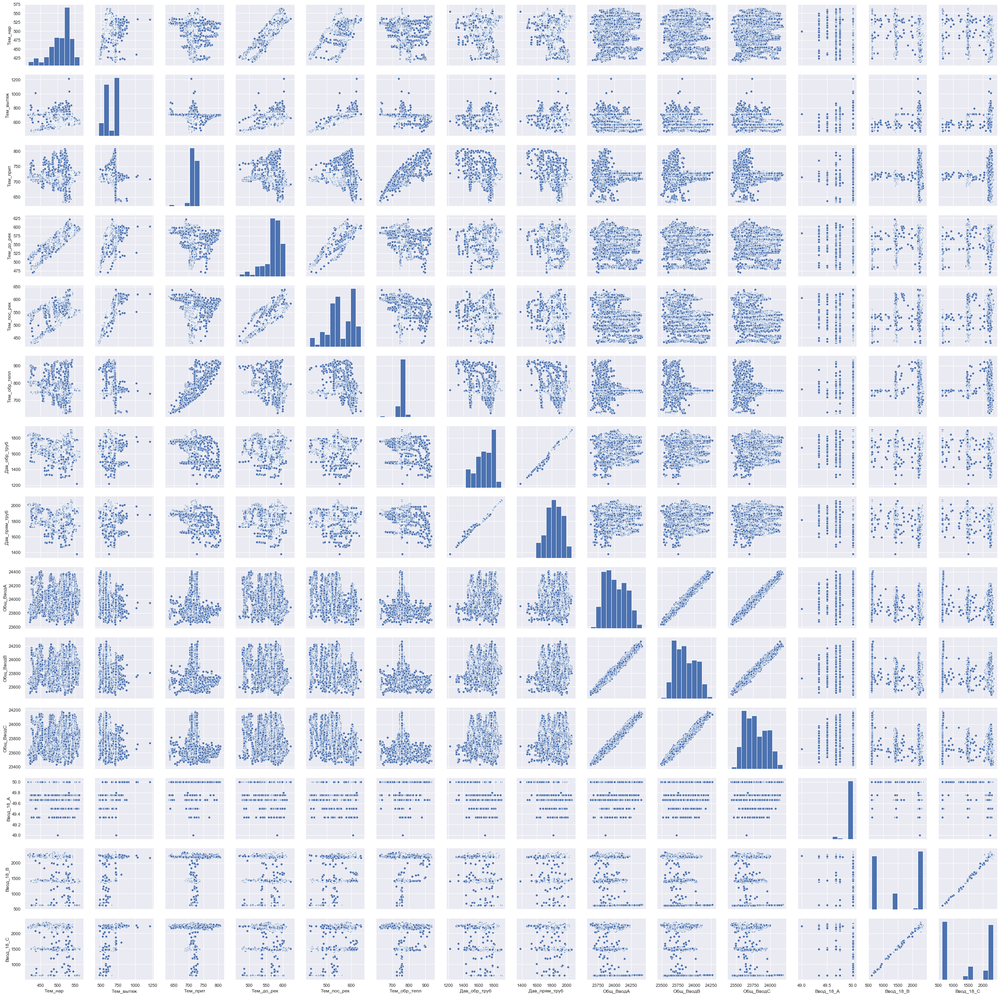

In [35]:
plot18_full = plotting(df18,df18.columns)

In [36]:
plot18_full.savefig("output18_full.png")

## Selected plot

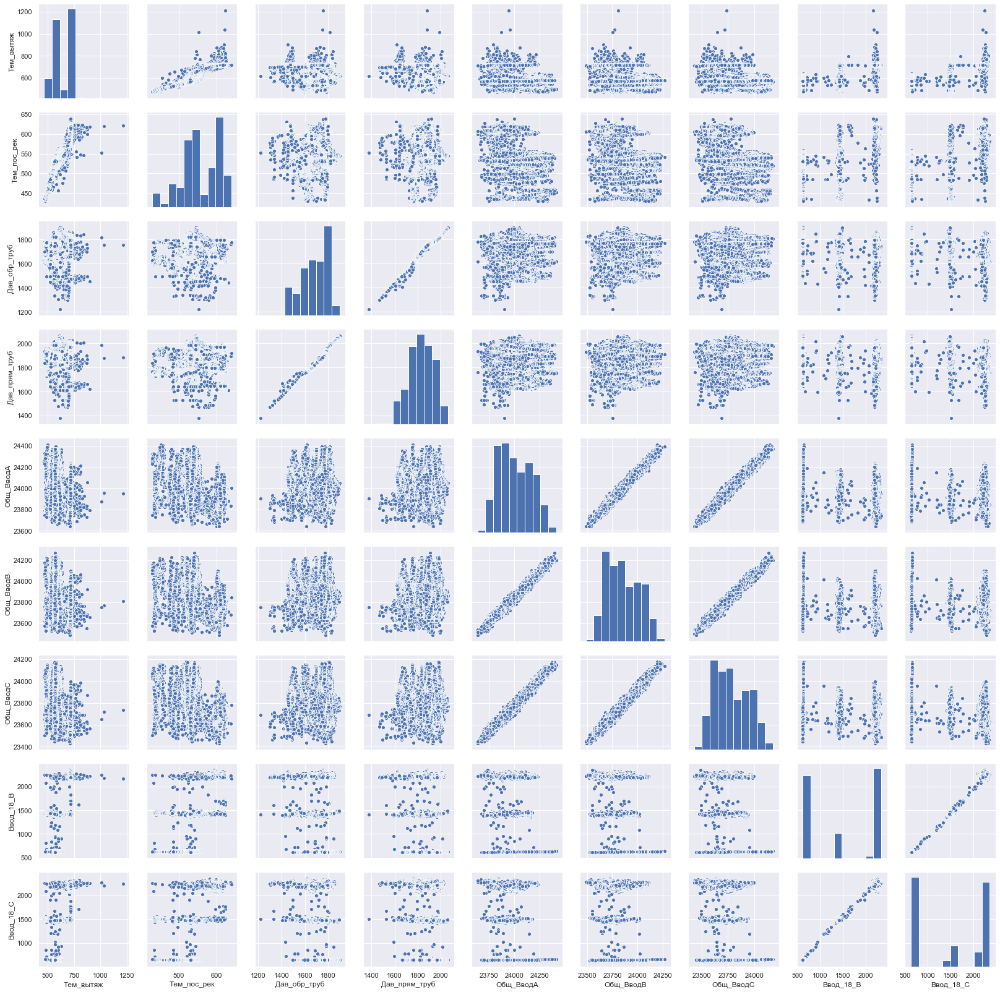

In [18]:
variables18 = ['Тем_вытяж','Тем_пос_рек','Дав_обр_труб','Дав_прям_труб','Общ_ВводА','Общ_ВводB','Общ_ВводC','Ввод_18_B','Ввод_18_C']
plot18 = plotting(df18,variables18)

In [ ]:
plot18.savefig("output18.png")

# Установка ПВ-17 

## Модуль № 0008В0

1. Температура наружного воздуха (ТЕ 1)
2. Температура вытяжного воздуха (ТЕ 2)
3. Температура приточного воздуха (ТЕ 3)
4. Температура до рекуператора (ТЕ 4)
5. Температура после рекуператора (ТЕ 5)
6. Температура обратного теплоносителя (ТЕ 6)
7. Освещённость в вент.камере
8. Давление в обратном трубопроводе
9. Давление в прямом трубопроводе


In [28]:
cols = ['time','id','Тем_нар','Тем_вытяж','Тем_прит','Тем_до_рек','Тем_пос_рек','Тем_обр_тепл','O','Дав_обр_труб','Дав_прям_труб']
data17 = pd.read_csv('data-00086E-PV17.csv', names = cols, header = 0) 

In [29]:
df3 = minutes(data17)
df3.sample(10)

,minutes,Тем_нар,Тем_вытяж,Тем_прит,Тем_до_рек,Тем_пос_рек,Тем_обр_тепл,O,Дав_обр_труб,Дав_прям_труб
20909,2019-02-22 18:45,474.000000,633.666667,733.000000,595.000000,490.000000,771.00,0.0,1680.666667,1868.000000
3081,2019-02-10 09:22,473.333333,689.000000,712.000000,658.666667,563.000000,772.00,0.0,1761.000000,1952.000000
24551,2019-02-25 07:27,532.666667,696.000000,716.000000,674.000000,602.000000,751.00,0.0,1658.333333,1863.000000
21602,2019-02-23 06:18,413.333333,693.000000,719.000000,646.000000,539.000000,807.00,0.0,1601.000000,1805.000000
985,2019-02-08 22:26,524.000000,627.000000,729.000000,627.000000,525.000000,770.00,0.0,1596.000000,1778.000000
17823,2019-02-20 15:19,544.250000,706.750000,710.000000,683.500000,618.500000,731.50,0.0,1773.250000,1972.000000
10071,2019-02-15 05:52,512.250000,698.500000,682.000000,667.500000,594.750000,681.25,0.0,1571.500000,1723.250000
8724,2019-02-14 07:25,474.000000,702.000000,721.666667,666.000000,568.666667,780.00,0.0,1717.000000,1906.333333
29704,2019-02-28 21:20,545.000000,647.666667,730.000000,638.000000,549.000000,772.00,0.0,1780.333333,1976.666667
931,2019-02-08 21:32,529.000000,630.000000,731.000000,630.000000,529.000000,772.00,0.0,1598.000000,1800.000000


In [30]:
df3.drop('O',axis =1, inplace = True)
df3.to_csv('PV17_in_minutes.csv')
df3.sample(10)

,minutes,Тем_нар,Тем_вытяж,Тем_прит,Тем_до_рек,Тем_пос_рек,Тем_обр_тепл,Дав_обр_труб,Дав_прям_труб
2582,2019-02-10 01:03,515.25,624.75,727.000000,618.25,516.000000,769.750000,1747.750000,1954.750000
25837,2019-02-26 04:53,541.00,638.00,726.000000,633.00,543.000000,772.000000,1866.666667,2044.000000
5940,2019-02-12 09:01,527.75,701.50,717.500000,675.50,599.250000,752.000000,1726.750000,1929.000000
19815,2019-02-22 00:31,463.00,618.00,733.000000,585.00,477.000000,769.000000,1815.666667,2013.666667
18020,2019-02-20 18:36,552.00,653.00,722.666667,641.00,556.000000,783.000000,1570.333333,1734.000000
8186,2019-02-13 22:27,510.00,633.00,732.000000,619.00,515.000000,770.000000,1720.666667,1921.000000
29770,2019-02-28 22:26,546.00,647.00,731.000000,635.00,547.000000,772.000000,1742.666667,1942.666667
14900,2019-02-18 14:23,500.00,711.00,707.333333,680.00,599.333333,744.000000,1695.333333,1885.000000
20828,2019-02-22 17:24,472.00,644.00,722.000000,597.00,492.000000,759.333333,1682.666667,1870.333333
23542,2019-02-24 14:38,518.75,698.75,712.500000,669.00,614.750000,752.000000,1758.500000,1960.000000


## Модуль № 0008В9

In [31]:
cols1 = ['time','id','Общ_ВводА','Общ_ВводB','Общ_ВводC','Ввод_17_А','Ввод_17_B','Ввод_17_C','Ввод_18_А','Ввод_18_B','Ввод_18_C']
data1718_ = pd.read_csv('data-0008B9.csv', names = cols1, header = 0) 
data1718_.drop(['Ввод_18_А','Ввод_18_B','Ввод_18_C','id'], axis = 1,inplace = True)
data1718_.head()

,time,Общ_ВводА,Общ_ВводB,Общ_ВводC,Ввод_17_А,Ввод_17_B,Ввод_17_C
0,2019-03-01 11:42:09,24107,23924,23863,42081,40677,41745
1,2019-03-01 11:41:51,24077,23985,23863,42111,40616,41806
2,2019-03-01 11:41:33,24107,23924,23863,42081,40677,41745
3,2019-03-01 11:41:14,24077,23955,23893,42081,40647,41806
4,2019-03-01 11:40:56,24077,23924,23863,42050,40616,41776


In [32]:
df4 = minutes(data1718_)
df4

,minutes,Общ_ВводА,Общ_ВводB,Общ_ВводC,Ввод_17_А,Ввод_17_B,Ввод_17_C
0,2019-02-08 02:49,24107.500000,23924.000000,23878.000000,42080.500000,40677.000000,41775.500000
1,2019-02-08 02:50,24107.000000,23944.666667,23883.000000,42101.000000,40677.333333,41796.000000
2,2019-02-08 02:51,24127.666667,23944.666667,23852.333333,42111.333333,40657.000000,41755.666667
3,2019-02-08 02:52,24099.500000,23924.000000,23863.000000,42050.250000,40661.750000,41752.750000
4,2019-02-08 02:53,24097.000000,23934.333333,23863.000000,42070.666667,40677.333333,41745.333333
...,...,...,...,...,...,...,...
30744,2019-03-01 11:38,24107.000000,23924.000000,23862.666667,42070.333333,40667.000000,41745.333333
30745,2019-03-01 11:39,24117.333333,23964.666667,23852.666667,42111.333333,40657.000000,41786.000000
30746,2019-03-01 11:40,24107.250000,23954.750000,23862.750000,42119.000000,40639.000000,41775.750000
30747,2019-03-01 11:41,24087.000000,23954.666667,23873.000000,42091.000000,40646.666667,41785.666667


## Joining

In [33]:
df17 = pd.merge(df3,df4)
df17

,minutes,Тем_нар,Тем_вытяж,Тем_прит,Тем_до_рек,Тем_пос_рек,Тем_обр_тепл,Дав_обр_труб,Дав_прям_труб,Общ_ВводА,Общ_ВводB,Общ_ВводC,Ввод_17_А,Ввод_17_B,Ввод_17_C
0,2019-02-08 06:01,505.000000,692.666667,720.666667,663.00,583.333333,770.0,1759.333333,1959.000000,23839.750000,23672.000000,23611.250000,41615.750000,40227.000000,41310.750000
1,2019-02-08 06:02,498.333333,700.333333,726.000000,663.00,589.000000,770.0,1763.000000,1962.000000,23842.333333,23710.333333,23618.666667,41643.666667,40219.333333,41359.000000
2,2019-02-08 06:03,509.750000,693.000000,714.500000,663.75,591.750000,770.5,1763.750000,1963.000000,23873.000000,23700.000000,23639.000000,41664.000000,40270.666667,41338.666667
3,2019-02-08 06:04,511.666667,694.000000,720.666667,663.00,599.333333,771.0,1760.000000,1961.000000,23863.000000,23680.000000,23608.333333,41653.666667,40249.666667,41328.333333
4,2019-02-08 06:05,503.000000,691.000000,718.000000,664.00,586.333333,770.0,1767.333333,1966.333333,23832.000000,23702.500000,23619.000000,41623.250000,40234.500000,41371.500000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
30552,2019-03-01 11:38,531.250000,702.000000,717.500000,680.75,607.000000,752.0,1748.250000,1949.000000,24107.000000,23924.000000,23862.666667,42070.333333,40667.000000,41745.333333
30553,2019-03-01 11:39,533.666667,703.000000,718.666667,680.00,612.333333,752.0,1750.000000,1950.000000,24117.333333,23964.666667,23852.666667,42111.333333,40657.000000,41786.000000
30554,2019-03-01 11:40,531.666667,708.666667,719.666667,680.00,602.000000,752.0,1748.000000,1950.000000,24107.250000,23954.750000,23862.750000,42119.000000,40639.000000,41775.750000
30555,2019-03-01 11:41,533.500000,703.500000,718.250000,680.75,611.000000,752.0,1749.000000,1952.000000,24087.000000,23954.666667,23873.000000,42091.000000,40646.666667,41785.666667


In [34]:
df17= df17.drop(['minutes'],axis = 1)

In [35]:
pearson17 = corr(df17,'pearson')
pearson17[pearson17>0.95]

,Тем_нар,Тем_вытяж,Тем_прит,Тем_до_рек,Тем_пос_рек,Тем_обр_тепл,Дав_обр_труб,Дав_прям_труб,Общ_ВводА,Общ_ВводB,Общ_ВводC,Ввод_17_А,Ввод_17_B,Ввод_17_C
Тем_нар,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Тем_вытяж,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Тем_прит,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Тем_до_рек,NaN,NaN,NaN,NaN,0.976248,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Тем_пос_рек,NaN,NaN,NaN,0.976248,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Тем_обр_тепл,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Дав_обр_труб,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.99342,NaN,NaN,NaN,NaN,NaN,NaN
Дав_прям_труб,NaN,NaN,NaN,NaN,NaN,NaN,0.99342,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Общ_ВводА,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.989250,0.987901,0.996106,0.994442,0.986464
Общ_ВводB,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.989250,NaN,0.989366,0.995202,0.985919,0.995961


In [36]:
cor_table17 = corr_table(pearson17)
cor_table17.drop(['Sensor min','Value min'],axis = 1,inplace=True)
cor_table17.columns = ['Sensor A','Sensor B','Max corrolation']
cor_table17[cor_table17['Max corrolation']>0.9]

,Sensor A,Sensor B,Max corrolation
1,Тем_вытяж,Тем_до_рек,0.948492
3,Тем_до_рек,Тем_пос_рек,0.976248
4,Тем_пос_рек,Тем_до_рек,0.976248
6,Дав_обр_труб,Дав_прям_труб,0.993420
7,Дав_прям_труб,Дав_обр_труб,0.993420
8,Общ_ВводА,Ввод_17_А,0.996106
9,Общ_ВводB,Ввод_17_C,0.995961
10,Общ_ВводC,Ввод_17_C,0.995518
11,Ввод_17_А,Общ_ВводА,0.996106
12,Ввод_17_B,Общ_ВводC,0.994716


In [37]:
print('Первый датасет =',len(data17), '; После groupby = ',len(df3))
print('Второй датасет =',len(data1718_), '; После groupby = ',len(df4))
print('После join = ', len(df17))

Первый датасет = 100000 ; После groupby =  30567
Второй датасет = 100000 ; После groupby =  30749
После join =  30557


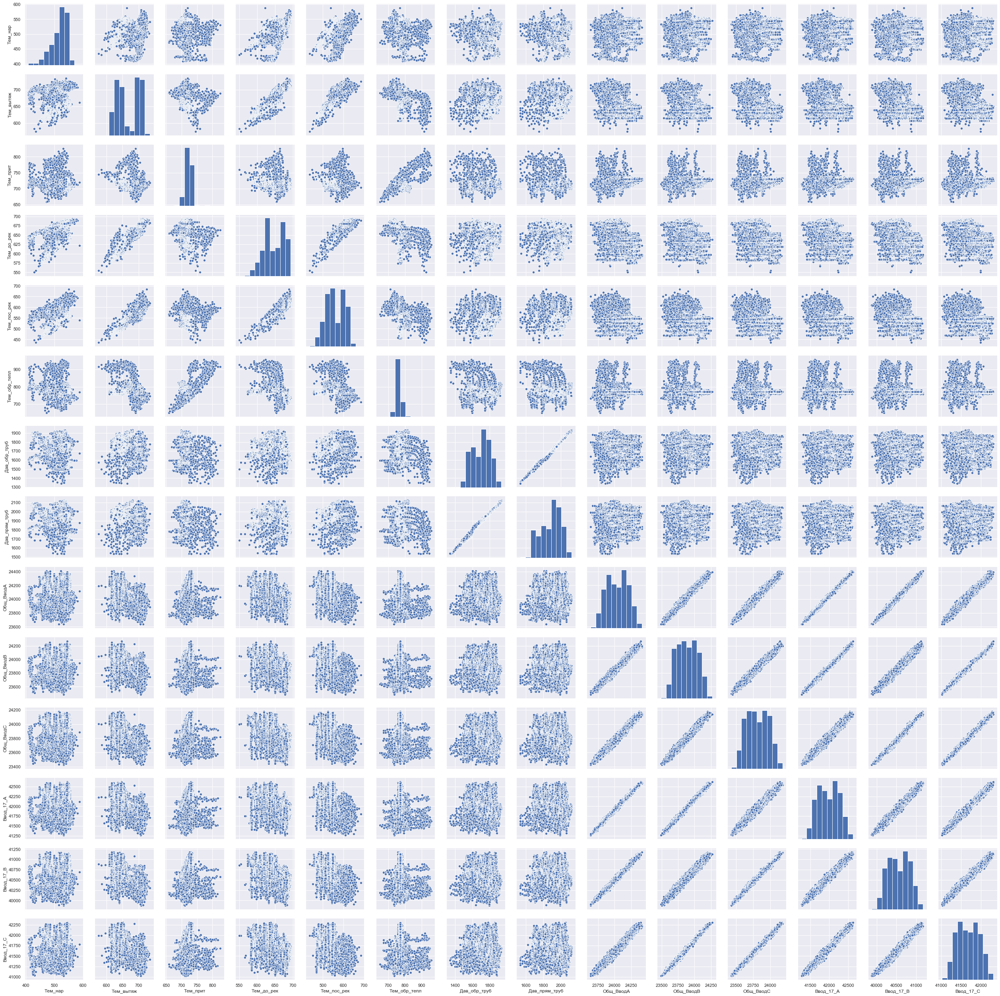

In [38]:
plot17_full = plotting(df17,df17.columns)

In [39]:
plot17_full.savefig("output17_full.png")

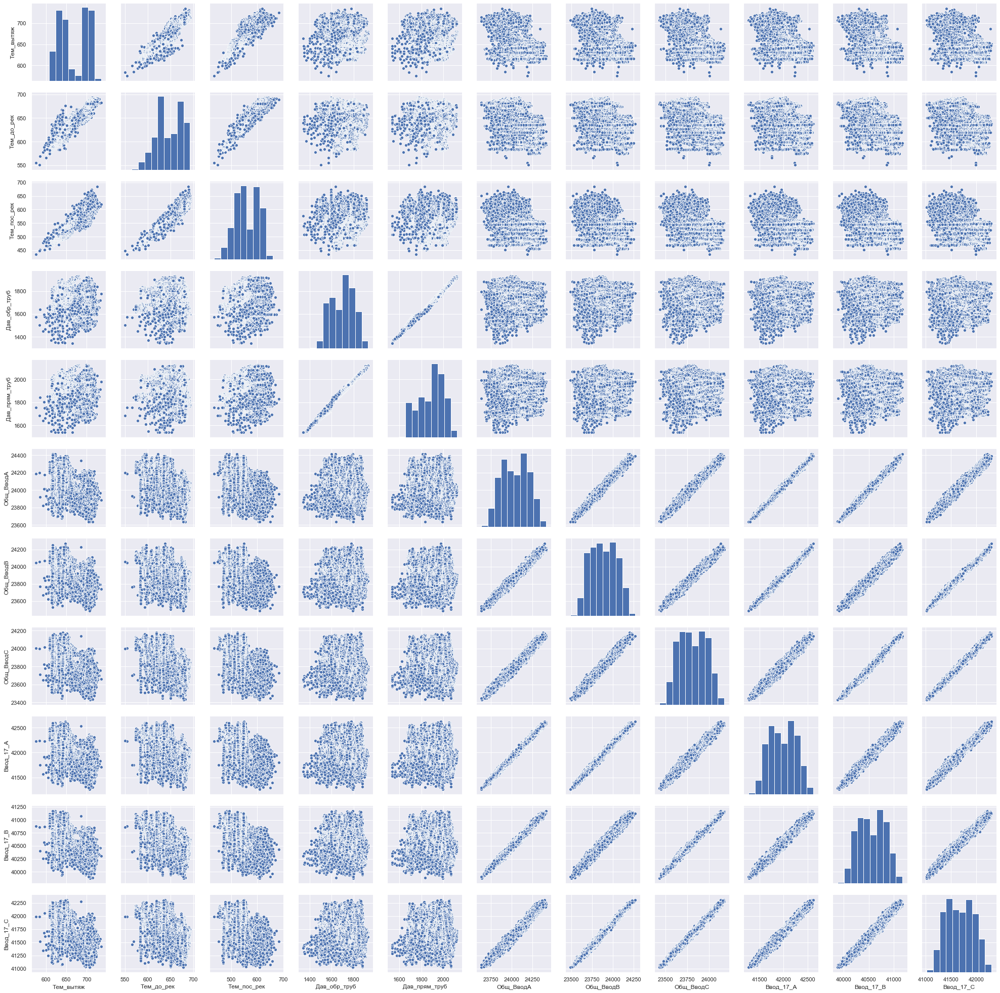

In [30]:
variables17 = ['Тем_вытяж','Тем_до_рек','Тем_пос_рек','Дав_обр_труб','Дав_прям_труб','Общ_ВводА','Общ_ВводB','Общ_ВводC','Ввод_17_А','Ввод_17_B','Ввод_17_C']
plot17 = plotting(df17,variables17)

In [31]:
plot17.savefig("output17.png")

In [38]:
df17.describe()

,Тем_нар,Тем_вытяж,Тем_прит,Тем_до_рек,Тем_пос_рек,Тем_обр_тепл,Дав_обр_труб,Дав_прям_труб,Общ_ВводА,Общ_ВводB,Общ_ВводC,Ввод_17_А,Ввод_17_B,Ввод_17_C
count,30557.000000,30557.000000,30557.000000,30557.000000,30557.000000,30557.000000,30557.000000,30557.000000,30557.000000,30557.000000,30557.000000,30557.000000,30557.000000,30557.000000
mean,516.597643,666.931396,721.588324,646.620371,560.041319,766.055372,1697.842570,1886.367390,24039.324025,23883.977051,23812.409136,41976.489371,40558.883146,41678.287524
std,27.771781,34.764063,10.478146,28.428901,43.447635,19.935168,103.806912,111.194561,156.063365,152.299897,153.392395,270.955651,262.172414,266.198107
min,409.000000,575.333333,658.666667,550.333333,435.333333,649.000000,1342.666667,1537.000000,23639.000000,23486.333333,23428.250000,41267.666667,39876.000000,41023.000000
25%,501.000000,635.000000,715.000000,623.333333,527.000000,756.500000,1597.000000,1798.000000,23913.666667,23761.000000,23687.500000,41755.333333,40341.750000,41460.333333
50%,523.666667,657.000000,722.666667,647.000000,552.000000,769.000000,1713.750000,1907.333333,24036.000000,23883.000000,23812.000000,41974.000000,40555.333333,41674.000000
75%,538.000000,702.000000,729.000000,674.000000,600.750000,772.000000,1774.666667,1970.000000,24168.000000,24008.000000,23939.500000,42203.000000,40776.250000,41897.666667
max,588.333333,735.000000,825.333333,693.250000,684.000000,956.750000,1932.500000,2123.750000,24412.000000,24270.000000,24178.333333,42620.000000,41175.333333,42305.000000


In [ ]:
Температура в Шкале Ранкина 
Давление 
Ток в мА